## Experimentaly grabbed data from SLAVIA detector 

The Parallella (Pcko) grabbing unit was used to capture triggered data  from SLAVIA. Trigger was generated by oscilloscope. The setup of trigger requires minimal pulse width to generate the trigger signal. 

In [3]:
import numpy as np
import sys

from matplotlib import pyplot as plt

headerdt = np.dtype([
	("startOffset", "<i8"),
	("descSpan", "<i8"),
	("preTrigger", "<i8"),
	("postTrigger", "<i8"),
	("fractBase", "<i8")
])

syncposdt = np.dtype([
	("w", "<i8"),
	("f", "<u1")
])

def loadrec(file):
	head = np.frombuffer(file.read(headerdt.itemsize), dtype=headerdt)[0]
	samples = np.frombuffer(file.read((head['preTrigger'] + head['postTrigger']) * head['descSpan']),
					dtype=np.dtype("(8,)<i2"))
	synclog = np.frombuffer(file.read(), dtype=syncposdt)

	return head, samples, synclog

def edges(rec):
	h, s, p = rec
	num_samples = 4096
	r = [
		(m['w'] - h['startOffset'], float(m['f']) / h['fractBase'])
		for m in p
	]

	return [
		(s[a-num_samples:a+num_samples], np.arange(-num_samples, num_samples) + b)
		for a, b in r
		if a > num_samples and a < len(s) - num_samples
	]


In [4]:
%matplotlib inline
import scipy.signal
import numpy as np
from pylab import plt
import math

def waterfallize_pre(signal, bins):
    window = 0.5 * (1.0 - np.cos((2 * math.pi * np.arange(bins)) / bins))
    segment = int(bins / 2)
    nsegments = int(len(signal) / segment)
    m = np.repeat(np.reshape(signal[0:segment * nsegments], (nsegments, segment)), 2, axis=0)
    t = np.reshape(m[1:len(m) - 1], (nsegments - 1, bins))
    img = np.multiply(t, window)
    wf = np.fft.fft(img)
    return np.concatenate((wf[:, int(bins / 2):bins], wf[:, 0:int(bins / 2)]), axis=1)

def waterfallize(signal, bins):
    return np.log(np.abs(waterfallize_pre(signal, bins)))

def abs2(x):
    return x.real**2 + x.imag**2

def wf(samples, sample_rate, freq_offset=0, freq_lim=None, bins=8192, ax=None, title=None):
    img = waterfallize(samples, bins).T
    img[np.isneginf(img)] = np.nan
    # ^^ might not be needed, was copied from pysdr-recviewer
    
    if ax is None:
        fig, ax = plt.subplots(figsize=(24, 8))
    if title is not None:
        fig.suptitle(title)

    ax.imshow(img, extent=[0, len(samples)/sample_rate, freq_offset + sample_rate/2, freq_offset - sample_rate/2],
             aspect='auto', interpolation='none', cmap='magma')
    ax.set_xlabel('Time [s]'); ax.set_ylabel('Frequency [Hz]');
    
    if freq_lim is not None:
        ax.set_ylim(freq_lim[0] + freq_offset, freq_lim[1] + freq_offset)

    return ax


## Plotting of the data

Channels 2 and 3 were connected to GPS PPS pulses. 
Channels 4 and 5 were connected to the slavia receiver.  The coaxial cable from slavia was connected to oscilloscope and T-splited. The one coaxial cable was connected directly to the ethernet transformer connected to the (4) ADC input. The other one channel (5) was connected to the transformer through 20dB atennuator.


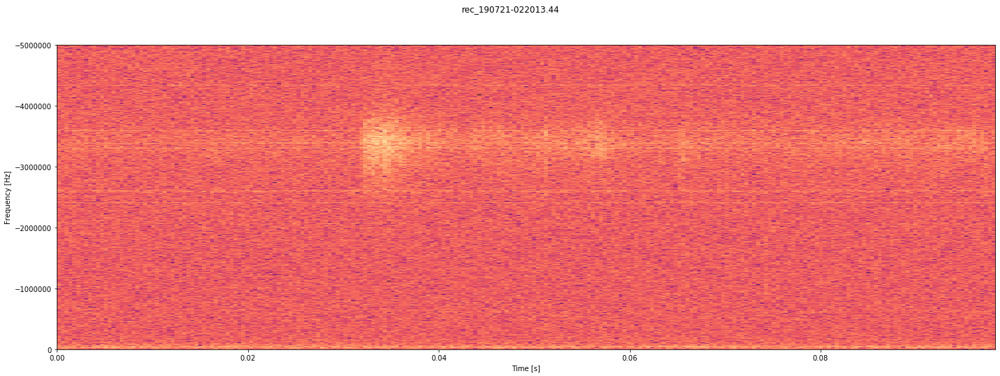

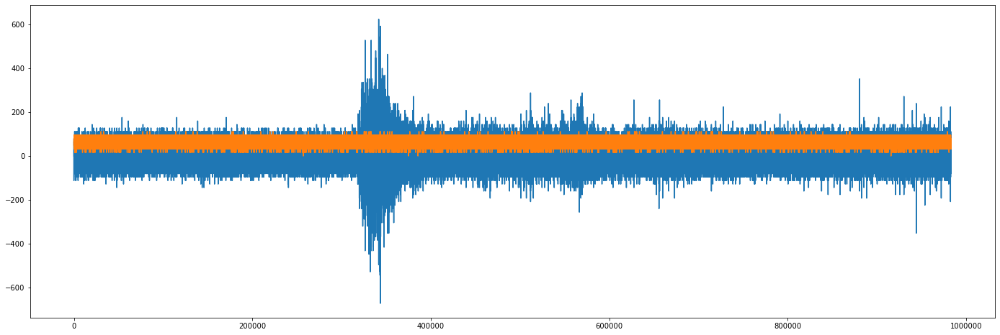

buffer size must be a multiple of element size


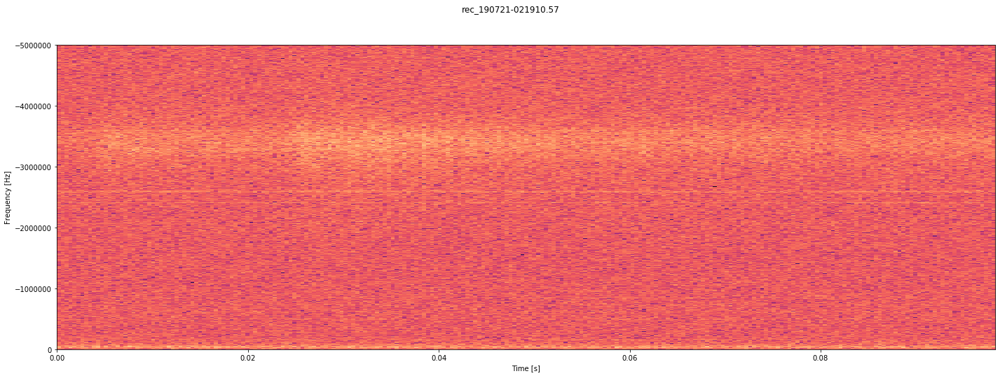

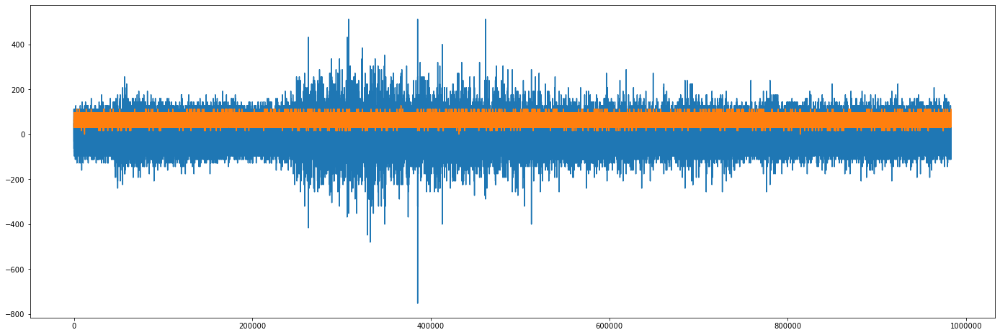

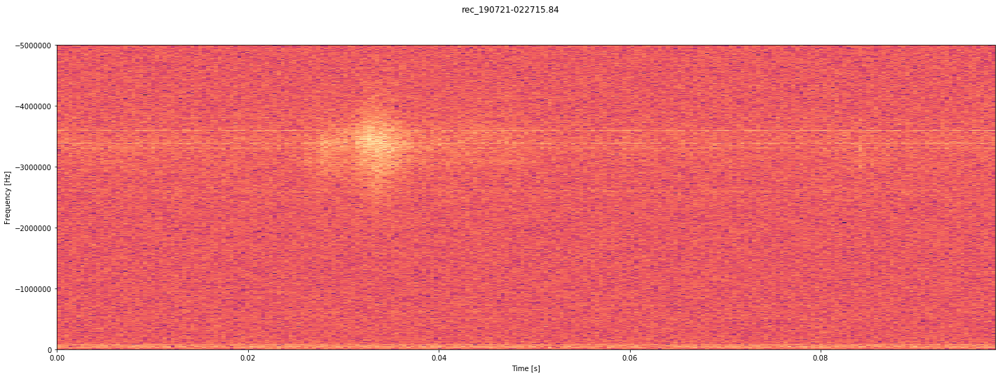

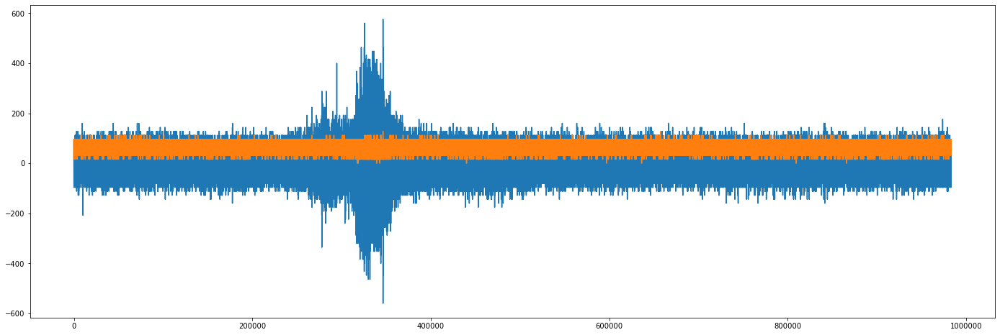

/nix/store/bzbi2yq42fzsi1p0jb86pj9wq4mbapc4-python3.7-ipykernel-5.1.4/lib/python3.7/site-packages/ipykernel_launcher.py:21: RuntimeWarning: overflow encountered in long_scalars


read length must be non-negative or -1
buffer size must be a multiple of element size


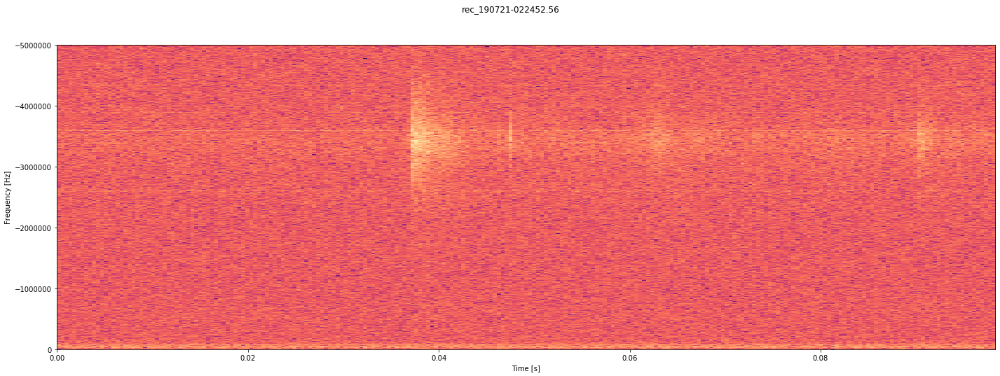

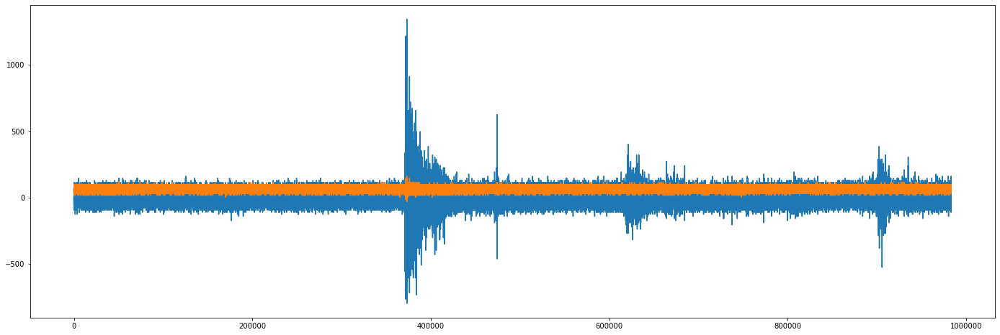

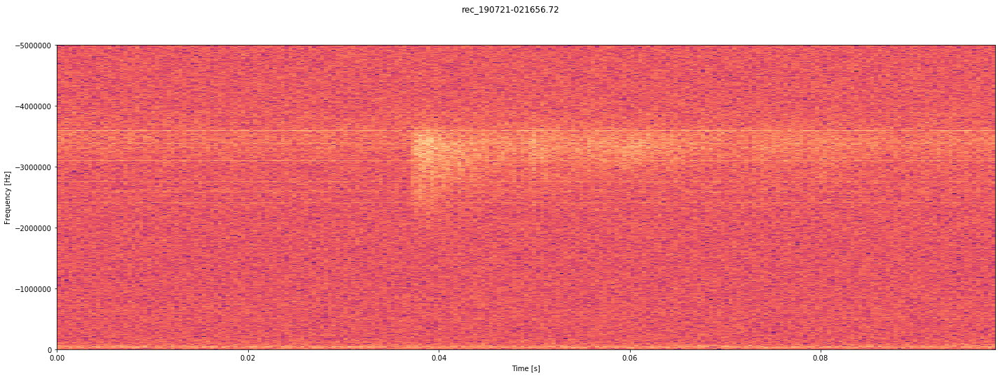

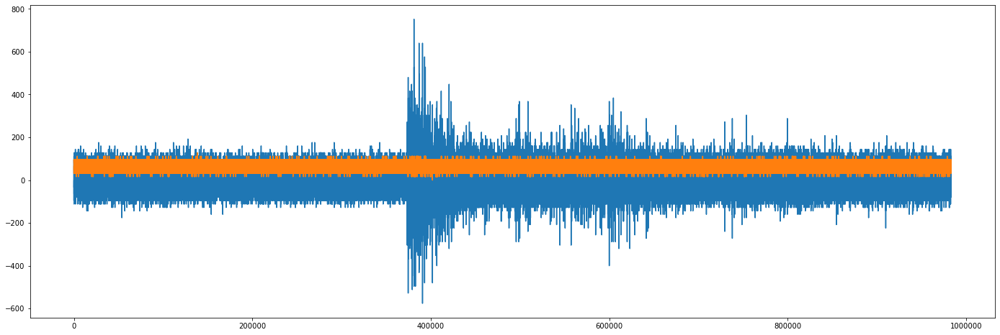

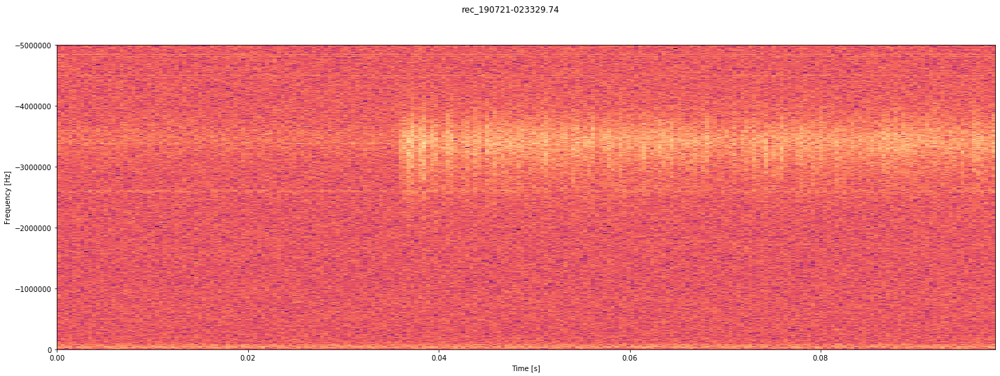

...

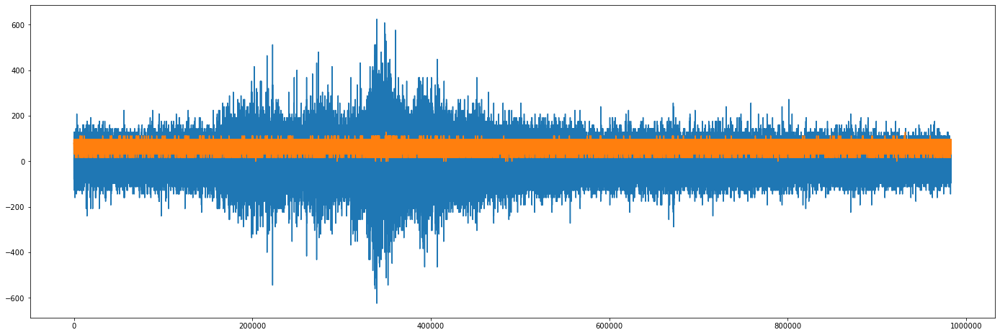

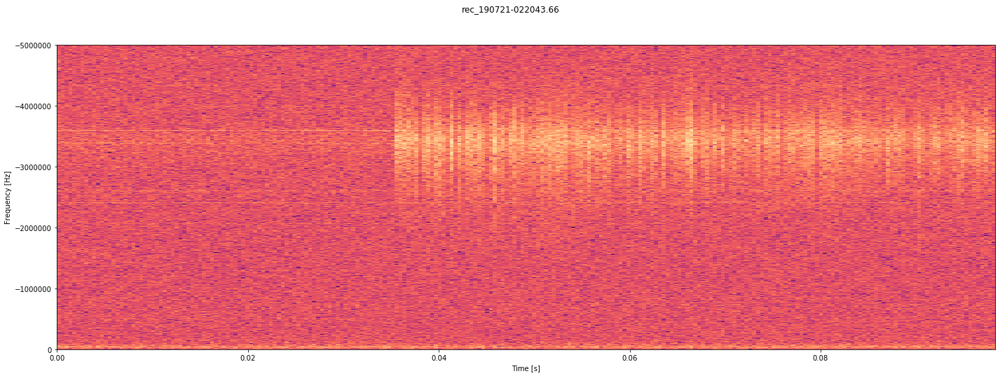

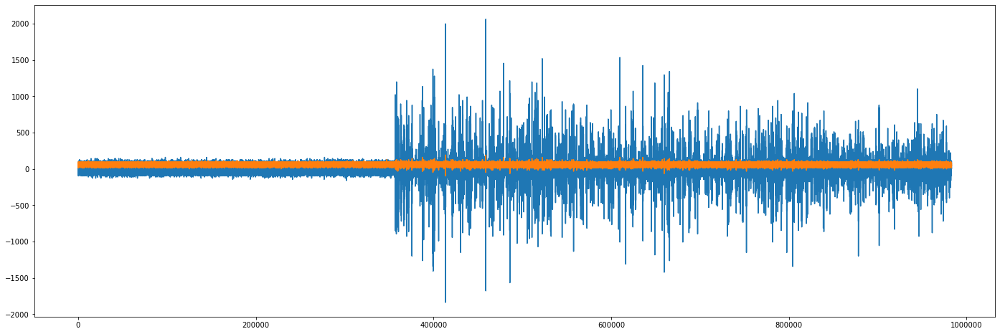

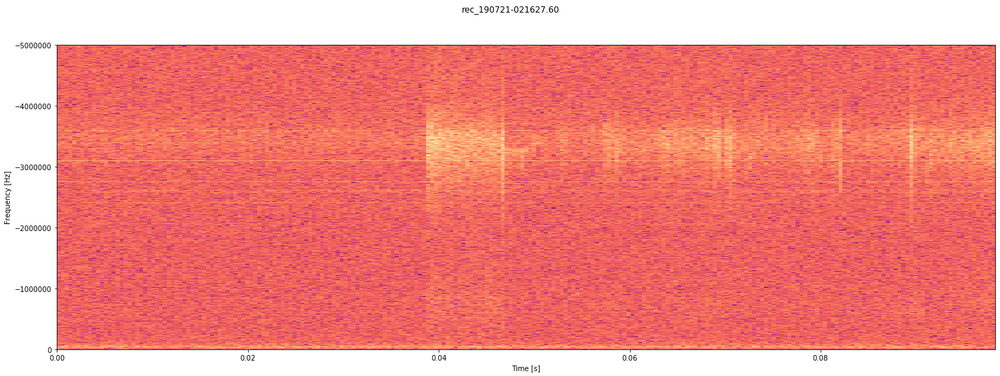

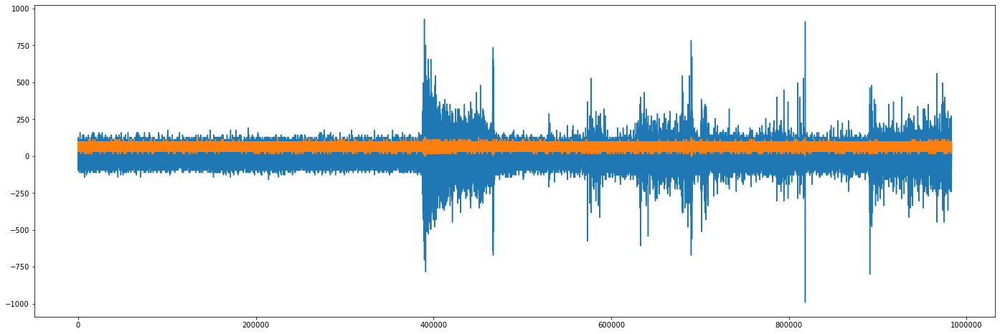

In [5]:
import os
pre_trigger_blocks = 5
post_trigger_blocks = 10

path = "/storage/experiments/2019/07_21_blesky/cesky_les/P_Slavia"
for fn in os.listdir(path):
    with open(os.path.join(path, fn), 'rb') as f:
        try:
            h, samples, synclog = loadrec(f)
            a = (h['preTrigger']-pre_trigger_blocks)*h['descSpan']//16 #select block of samples before trigger
            b = (h['preTrigger']+post_trigger_blocks)*h['descSpan']//16  #select blocks after trigger 
            wf(samples[a:b,4], 10000000, bins=8192, title=fn)
            plt.ylim(bottom = 0) 
            plt.xlim(left = 0) 
            plt.subplots(figsize=(24, 8))
            plt.plot(samples[a:b,4:6])
            plt.show()
        except Exception as e:
            print(e)

## Obtaining of the absolute timing

Unfortunatelly the system time at Parallella was not preciselly synced to realtime. Therefore the trigger times do not correspond to the recorded file name.  
The file name is only information about absolute time, all data in the file are stored relative to that time and relative to the time marks provided by GPS PPS signal.


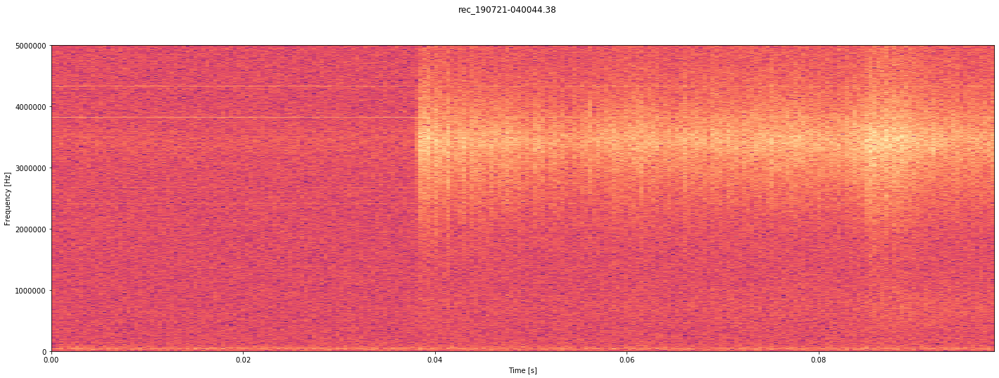

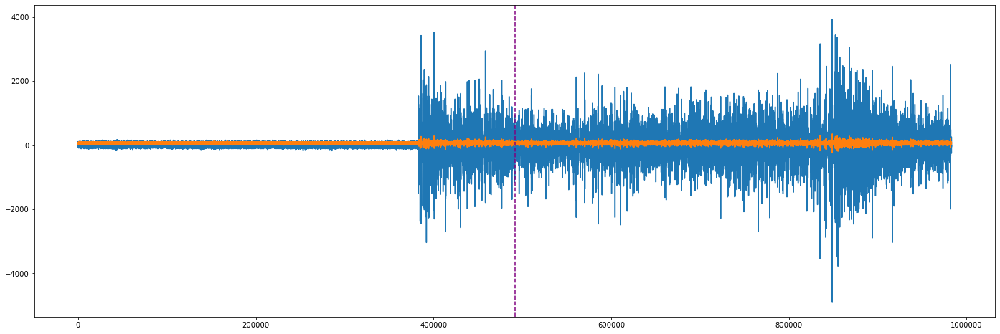

In [7]:
import os
pre_trigger_blocks = 5
post_trigger_blocks = 10
fn = "rec_190721-040044.38"
path = "/storage/experiments/2019/07_21_blesky/cesky_les/P_Slavia/"
with open(os.path.join(path, fn), 'rb') as f:
    try:
        h, samples, synclog = loadrec(f)
        a = (h['preTrigger']-pre_trigger_blocks)*h['descSpan']//16 #select block of samples before trigger
        b = (h['preTrigger']+post_trigger_blocks)*h['descSpan']//16  #select blocks after trigger 
        wf(samples[a:b,4], 10000000, bins=8192, freq_lim = [0,5e6] , title=fn)
        #plt.ylim(bottom = 0) 
        plt.xlim(left = 0) 
        plt.subplots(figsize=(24, 8))
        plt.plot(samples[a:b,4:6])
        plt.axvline(x=len(samples[a:b,4:6])/2, color='purple', ls='--')
        plt.show()
    except Exception as e:
        print(e)

## Correction of GPS Time for the leap seconds

Trriggers data were recorded by GPS time stamps marking it corresponds to UT time. The coordinated leap seconds need to be substracted to obtain UTC time. 

In [9]:
import pandas
import datetime
def dateparse (time_in_secs):    
    return datetime.datetime.utcfromtimestamp(float(time_in_secs))

triggers = pandas.read_csv('/storage/experiments/2019/07_21_blesky/cesky_les/P_Slavia/timemarks_filtered.csv',delimiter=',', parse_dates=True,date_parser=dateparse, index_col='DateTime', usecols = [0], names=['DateTime'], header=None, squeeze = True)
triggers['X'] = 1.1
triggers.index = triggers.index.shift( periods = -18, freq = "S") ## correct for leap seconds

In [11]:
path = "/storage/experiments/2019/07_21_blesky/cesky_les/P_Slavia/"
files = []
for fn in os.listdir(path):
    if fn[0] == "r":
        files.append(fn)
        
records = pandas.Series(data = 1 , index = (pandas.to_datetime(fn[4:], yearfirst = True) for fn in files))

In [12]:
df = pandas.concat([triggers,records], axis=1)

In [13]:
time_end = datetime.datetime(year = 2019, month = 7, day = 21, hour = 4, minute = 30)
time_start = datetime.datetime(year = 2019, month = 7, day = 21, hour = 3, minute = 45)

In [ ]:
plt.figure(figsize=(24,5))
plt.ylim(top = 3)
plt.xlim(time_start, time_end)
plt.plot(df[0],'g.',label = 'records')
plt.plot(df["X"],'r.',label = 'triggers')

/nix/store/n0smhbsq2qj2sdmx4wj87sbnm244i1qd-python3-3.7.5-env/lib/python3.7/site-packages/pandas/plotting/_matplotlib/converter.py:103: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


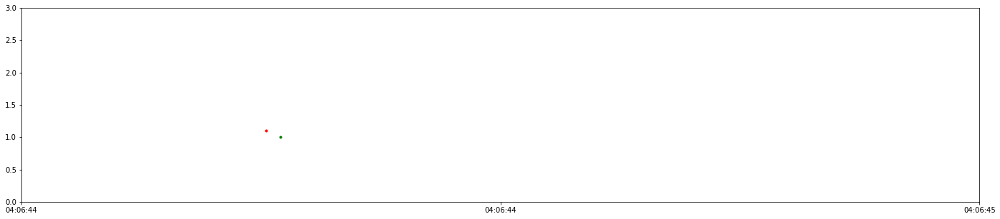

In [14]:
time_end = datetime.datetime(year = 2019, month = 7, day = 21, hour = 4, minute = 6, second = 45)
time_start = datetime.datetime(year = 2019, month = 7, day = 21, hour = 4, minute = 6, second = 44)
plt.figure(figsize=(24,5))
plt.ylim(top = 3)
plt.xlim(time_start, time_end)
plt.plot(df[0],'g.',label = 'records')
plt.plot(df["X"],'r.',label = 'triggers')